# Рынок заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо: 
- подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места;
- подготовить презентацию. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Доступно: 
- датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

Файл moscow_places.csv:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


## Шаг 1 и 2. Загрузка данных, изучение общей информации, предобработка

Загрузите данные о заведениях общественного питания Москвы. Путь к файлу: /datasets/moscow_places.csv. Скачать датасет.

Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?

In [1]:
#импортируем бибилиотеки
import pandas as pd
import warnings
import folium
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем карту и хороплет
from folium import Map, Choropleth
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go
import json


In [2]:
# Путь к файлу
try:
    places = pd.read_csv('/datasets/moscow_places.csv')
except:
    places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
print(places.head(5))

                   name  category                              address  \
0                WoWфли      кафе           Москва, улица Дыбенко, 7/1   
1        Четыре комнаты  ресторан   Москва, улица Дыбенко, 36, корп. 1   
2                 Хазри      кафе       Москва, Клязьминская улица, 15   
3  Dormouse Coffee Shop   кофейня  Москва, улица Маршала Федоренко, 12   
4             Иль Марко  пиццерия      Москва, Правобережная улица, 1Б   

                          district  \
0  Северный административный округ   
1  Северный административный округ   
2  Северный административный округ   
3  Северный административный округ   
4  Северный административный округ   

                                               hours        lat        lng  \
0                             ежедневно, 10:00–22:00  55.878494  37.478860   
1                             ежедневно, 10:00–22:00  55.875801  37.484479   
2  пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...  55.889146  37.525901   
3             

In [3]:
#информация по данным их файла
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#смотрим размер данных
places.shape

(8406, 14)

Итого:
- названия столбцов корректны
- проверить на дубли необходимо
- общее кол-во строк 8406, в части столбцов (всего их 14) отсутствуют данные- необходимо проверить на пропуски
- сменить тип данных столбце chain на boolean для удобства работы с данными

In [5]:
# приведем все названия заведений и адреса в нижний регистр, чтобы проверить дубли
places['name']=places['name'].str.lower()
places['address'] = places['address'].str.lower()

In [6]:
# проверка дублей
places.duplicated().sum()

0

In [7]:
# проверка на неявные дубликаты
print('Неявные дубли: ', places.duplicated(subset=['name', 'address']).sum())

Неявные дубли:  4


In [8]:
places[places.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
places.loc[(places['name'] == 'кафе')& (places['address'] == 'москва, парк ангарские пруды')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


In [10]:
places.loc[(places['name'] == 'more poke')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"москва, духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


In [11]:
places.loc[(places['name'] == 'раковарня клешни и хвосты')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","москва, братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0


In [12]:
places.loc[(places['name'] == 'хлеб да выпечка')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"москва, каширское шоссе, 61г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


In [13]:
places.duplicated(subset=['name', 'address']).sum()
print(len(places))
places= places.drop_duplicates(subset=['name', 'address'])
print(len(places))

8406
8402


In [14]:
print('Количество заведений всего:', places['name'].nunique())

Количество заведений всего: 5512


In [15]:
# проверка на пропуски
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

- Явных дублей нет.

- Есть четыре заведения с дублированием месторасположения - провела очистку данных от этих неточностей.

- Всего 5484 уникальных заведений. А общее количество заведений 8346 единиц.

- Во всех заведениях известно наименование, категория, адрес, район, точные координаты, рейтинг и является ли заведение сетью или нет. Нет данных по ряду заведений таких как: часы работы, всего мест в заведении, цены - средний чек, средний средний чек, средний чек на кофе. 

- По имеющимся пропуска данных, обработать их нет невозможности. Рабочие часы и количество мест в заведении - указываются владельцами, некоторыми не указывается, собрать их не представляется возможным. Столбцы middle_avg_bill и middle_coffee_cup не могут быть заполнены при остуствии статистики. Возможно некоторые заведения просто не имеют middle_coffee_cup. 
- Проверим зависимость price oт avg_bill, как они влияют друг на друга. Выведем таблицу и сравним данные.

In [16]:
display(places.tail(50))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN
8357,чайхана у али,кафе,"москва, волжский бульвар, 1, корп. 1",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.719505,37.743565,4.2,средние,Средний счёт:250–450 ₽,350.0,NaN,0,NaN
8358,зар,кафе,"москва, волгоградский проспект, 42к7",Юго-Восточный административный округ,пн-пт 07:00–19:00; сб 10:00–17:00,55.709403,37.723476,3.7,NaN,NaN,NaN,NaN,0,NaN
8359,neбо,ресторан,"москва, привольная улица, 63",Юго-Восточный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–06:00; вс 11:00...",55.681934,37.847216,4.2,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,80.0
8360,сетевое кафе,кафе,"москва, юго-восточный административный округ, ...",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.693629,37.781027,3.3,NaN,NaN,NaN,NaN,0,NaN
8361,блин ешь,быстрое питание,"москва, улица маршала чуйкова, 4",Юго-Восточный административный округ,пн-сб 10:30–21:30,55.704403,37.763744,4.3,NaN,NaN,NaN,NaN,0,150.0
8362,достор,кафе,"москва, вешняковская улица, 43",Восточный административный округ,"ежедневно, 09:00–00:00",55.716153,37.821948,4.1,средние,Средний счёт:300–800 ₽,550.0,NaN,0,0.0
8363,лаунж бар кенч,кафе,"москва, вешняковская улица, 39бс1",Восточный административный округ,"ежедневно, 11:00–05:00",55.718606,37.825216,4.0,NaN,NaN,NaN,NaN,0,NaN
8364,агат 24,кафе,"москва, 2-й вязовский проезд, 22соор3-4",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.715939,37.767436,4.0,средние,Средний счёт:300 ₽,300.0,NaN,0,NaN
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0


In [17]:
print(places['price'].unique())

[nan 'выше среднего' 'средние' 'высокие' 'низкие']


In [18]:
print(places['avg_bill'].unique())

[nan 'Средний счёт:1500–1600 ₽' 'Средний счёт:от 1000 ₽'
 'Цена чашки капучино:155–185 ₽' 'Средний счёт:400–600 ₽'
 'Средний счёт:199 ₽' 'Средний счёт:200–300 ₽' 'Средний счёт:от 500 ₽'
 'Средний счёт:1000–1200 ₽' 'Цена бокала пива:250–350 ₽'
 'Средний счёт:330 ₽' 'Средний счёт:1500 ₽' 'Средний счёт:300–500 ₽'
 'Средний счёт:140–350 ₽' 'Средний счёт:350–500 ₽'
 'Средний счёт:300–1500 ₽' 'Средний счёт:от 240 ₽'
 'Средний счёт:200–250 ₽' 'Средний счёт:328 ₽' 'Средний счёт:300 ₽'
 'Средний счёт:от 345 ₽' 'Средний счёт:60–400 ₽' 'Средний счёт:900 ₽'
 'Средний счёт:500–800 ₽' 'Средний счёт:500–1000 ₽'
 'Средний счёт:600–700 ₽' 'Цена бокала пива:120–350 ₽'
 'Средний счёт:1000–1500 ₽' 'Средний счёт:1500–2000 ₽'
 'Цена чашки капучино:150–190 ₽' 'Средний счёт:2000–2500 ₽'
 'Средний счёт:600 ₽' 'Средний счёт:450 ₽' 'Цена чашки капучино:120–170 ₽'
 'Средний счёт:100–500 ₽' 'Средний счёт:от 850 ₽'
 'Цена чашки капучино:100–200 ₽' 'Средний счёт:250–600 ₽'
 'Средний счёт:2100 ₽' 'Средний счёт:349 ₽'

Закономерность присвоения статуса для avg_bill по price визуально не выявлена. Средний счет имеет слишком много категорий и разную ценовую политику, сложно за основу взять какие-либо данные. Пропуски оставляем, чтобы не исказить данные.

In [19]:
# добавим столбец chain_places, содержащее булевые значения принадлежности к сети
places['chain_place'] = places['chain'] == 1
# удалим ненужный больше столбец chain
# places = places.drop(['chain'], axis=1)
display(places.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,True


In [20]:
# посмотрим какие заведения чаще всего упоминаются в данных
print(places['name'].value_counts())

кафе                          188
шоколадница                   120
домино'с пицца                 77
додо пицца                     74
one price coffee               72
                             ... 
моби кит                        1
поесть мы любим больше чем      1
nero bean coffee roastery       1
свои люди                       1
like cafe                       1
Name: name, Length: 5512, dtype: int64


In [21]:
# узнаем какого типа заведений больше всего, с чем будем работать
places['category'].value_counts()

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [22]:
# и по какому району больше всего заведений
places['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [23]:
#lданные по посадочным местам в заведениях
places['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [24]:
#данные по сетевым и несетевым заведениям
places['chain_place'].value_counts()

False    5199
True     3203
Name: chain_place, dtype: int64

In [25]:
places['rating'].value_counts()

4.3    1513
4.4    1350
4.2    1040
4.1     784
4.5     623
4.0     499
4.7     440
4.6     422
3.9     252
4.9     243
4.8     215
3.8     188
3.7     147
5.0     105
3.6      76
3.5      72
3.4      68
3.3      54
3.2      40
3.1      37
2.9      31
2.8      30
3.0      24
2.6      15
1.1      14
2.5      14
2.3      14
2.2      13
2.4      11
2.7      11
1.3      11
1.4      11
1.0      10
1.7       6
2.1       4
2.0       4
1.9       4
1.6       2
1.8       2
1.5       2
1.2       1
Name: rating, dtype: int64

In [26]:
places['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

**Вывод:**

Больше всего кафе и ресторанов в данных, превалируют заведения в ЦАО, также среднее кол-во посадочных мест около 75, однако есть заведения на 1288 мест, а есть вообще без них - возможно работают на вынос. Всего 3205 сетевых заведений, и 5201 не сетевых. Превалирует по сетевым заведениям- кафе, шоколадница, доминос пицца. Уникальных заведений всего 5512 единицы. Заведения с различными рейтингами, больше всего заведений с рейтингом 4.3. По тем заведениям, где есть рейтинг, можно сказать, что большенство заведений среднего рейтинга 2117 мест.

### Создайте столбец street с названиями улиц из столбца с адресом.


In [27]:
# создадим столбец с названием улицы
places['street'] = places['address'].apply(lambda x: x.split(sep=', ')[1])
# альтернативный вариант нашла
# places['street1']=[x.split(',')[1] for x in places['address'].values]

print(places.head(10))

                   name         category  \
0                wowфли             кафе   
1        четыре комнаты         ресторан   
2                 хазри             кафе   
3  dormouse coffee shop          кофейня   
4             иль марко         пиццерия   
5          sergio pizza         пиццерия   
6           огни города          бар,паб   
7            mr. уголёк  быстрое питание   
8           donna maria         ресторан   
9                готика             кафе   

                                   address                         district  \
0               москва, улица дыбенко, 7/1  Северный административный округ   
1       москва, улица дыбенко, 36, корп. 1  Северный административный округ   
2           москва, клязьминская улица, 15  Северный административный округ   
3      москва, улица маршала федоренко, 12  Северный административный округ   
4          москва, правобережная улица, 1б  Северный административный округ   
5             москва, ижорская улица, вл8

### Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.

In [28]:
places['is_24_7'] = places['hours'].fillna('').str.contains('ежедневно, круглосуточно')
print(places.tail(10))

                       name  category  \
8396         пекинский двор  ресторан   
8397  траектория крафт-кафе  пиццерия   
8398             на волгина      кафе   
8399    пекарня, кафе-гриль  булочная   
8400          практика кофе   кофейня   
8401             суши мания      кафе   
8402              миславнес      кафе   
8403                самовар      кафе   
8404           чайхана sabr      кафе   
8405             kebab time      кафе   

                                         address  \
8396             москва, ленинский проспект, 158   
8397     москва, улица лобачевского, 52, корп. 1   
8398         москва, улица академика волгина, 2а   
8399   москва, болотниковская улица, 52, корп. 2   
8400    москва, чонгарский бульвар, 26а, корп. 1   
8401               москва, профсоюзная улица, 56   
8402  москва, пролетарский проспект, 19, корп. 1   
8403      москва, люблинская улица, 112а, стр. 1   
8404      москва, люблинская улица, 112а, стр. 1   
8405              москва, ро

Столбец с указанием типа работы заведения по времени создан. Значение True подтверждает факт работы круглосуточно, соответственно значение False говорит об обратном.
Также название улицы было вынесено в отдельный столбец.

**Общий вывод:**

- Провелась подготовка данных, названия столбцов корректны, явных дублей не было.

- Было четыре заведения с дублированием месторасположения - провела очистку данных от этих неточностей.

- Всего 5484 уникальных заведений. А общее количество заведений 8346 единиц.

- Во всех заведениях известно наименование, категория, адрес, район, точные координаты, рейтинг и является ли заведение сетью или нет. Нет данных по ряду заведений таких как: часы работы, всего мест в заведении, цены - средний чек, средний средний чек, средний чек на кофе. 

- По имеющимся пропуска данных, обработать их нет невозможности. Рабочие часы и количество мест в заведении - указываются владельцами, некоторыми не указывается, собрать их не представляется возможным. Столбцы middle_avg_bill и middle_coffee_cup не могут быть заполнены при остуствии статистики. Возможно некоторые заведения просто не имеют middle_coffee_cup. 

- Добавлены столбцы отражающие название улицы и работу заведения в круглосуточном режиме или нет.


## Шаг 3. Анализ данных



### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [29]:
#определим какие категории имеем в данных по заведениям
category = places['category'].unique()
print('Всего имеем:', len(category), 'категорий:', ' -- '.join(category))

Всего имеем: 8 категорий: кафе -- ресторан -- кофейня -- пиццерия -- бар,паб -- быстрое питание -- булочная -- столовая


In [30]:
#сгруппируем и посчитаем данные по типу заведений в списке
places.groupby('category').count().reset_index().sort_values(by='name', ascending=False)

,category,name,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
3,кафе,2376,2376,2376,2002,2376,2376,2376,633,698,694,4,2376,1217,2376,2376,2376
6,ресторан,2042,2042,2042,1968,2042,2042,2042,1017,1040,1040,0,2042,1269,2042,2042,2042
4,кофейня,1413,1413,1413,1398,1413,1413,1413,476,721,200,521,1413,751,1413,1413,1413
0,"бар,паб",764,764,764,746,764,764,764,494,485,349,6,764,467,764,764,764
5,пиццерия,633,633,633,628,633,633,633,311,400,395,3,633,427,633,633,633
2,быстрое питание,603,603,603,570,603,603,603,190,238,237,1,603,349,603,603,603
7,столовая,315,315,315,306,315,315,315,153,181,181,0,315,164,315,315,315
1,булочная,256,256,256,249,256,256,256,41,53,53,0,256,148,256,256,256


In [31]:
#создадим визуализацию данных по количеству заведений в данных
fig = px.bar(places.groupby('category').count().reset_index().sort_values(by='name', ascending=False),
                y='name',
                x='category',
                text='name',
                color_discrete_sequence =['#f0acac']*len(places.groupby('category').count().reset_index().sort_values(by='name', ascending=False)),
                title='Кол-во объектов по типу заведения',
                labels={'name':'Количество','category':'Категория объекта'}
               )
fig.show()

In [32]:
#создадим визуализацию данных по доли категорий от общего числа
count_category = places.pivot_table(index=['category'], values='address', aggfunc='count').sort_values(by = 'address', ascending=False)
count_category.columns= ['values']

category_name = count_category.index
values = count_category['values']

fig = go.Figure(data=[go.Pie(labels=category_name, values=values, textinfo='label+percent',
                             insidetextorientation='radial', pull=[0.1, 0.1, 0.1])])
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.update_layout(title='Доля заведений по категориям от общего числа')          
fig.show() 


In [33]:
#создам сводную таблицу для будущего графика
category=(places.groupby('category')['name'].count().to_frame().reset_index().rename(columns = {'name':'count'}).sort_values(by='count'))
category['mean'] = (category['count']/category['count'].sum()).apply('{:.2%}'.format)
category

,category,count,mean
1,булочная,256,3.05%
7,столовая,315,3.75%
2,быстрое питание,603,7.18%
5,пиццерия,633,7.53%
0,"бар,паб",764,9.09%
4,кофейня,1413,16.82%
6,ресторан,2042,24.30%
3,кафе,2376,28.28%


In [34]:
# построим график соотношения заведений в Москве
fig = px.bar(category,
                y='count',
                x='category',
                text = 'mean',
                color = 'category',
                title='Доля заведений общественного питания Москвы по категориям',
                labels={'category':'Категория заведения', 'mean':'Доля, %'}
               )
fig.update_layout(xaxis ={"categoryorder":"total descending"}) 
fig.show()


Итого:
 - Всего имеем: 8 категорий: кафе -- ресторан -- кофейня -- пиццерия -- бар,паб -- быстрое питание -- булочная -- столовая
 - Больше всего в Москве кафе, на втором месте рестораны, на третьем кофейни.
 - Кафе составляют большую долю в 28% от общего числа заведений Москвы, самая меньшая доля заведений - булочные всего 3%.

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [35]:
#данные по сетевым и несетевым заведениям
places['chain_place'].value_counts()

False    5199
True     3203
Name: chain_place, dtype: int64

In [36]:
# построим график соотношения кол-ва сетевых и несетевых объектов в Москве
fig = px.bar(places.groupby('chain_place').count().reset_index().sort_values(by='name', ascending=False),
                y='name',
                x='chain_place',
                text = ['Несетевые', 'Сетевые'],
                color_discrete_sequence =['#f0acac']*len(places.groupby('chain_place').count().reset_index().sort_values(by='name', ascending=False)),
                title='Количество сетевых и несетевых объектов',
                labels={'chain_place':'Тип заведения', 'name':'Количество'}
               )
fig.show()

In [37]:
# подготовка данных

chain_no_chain = (places.groupby(['category', 'chain_place']).name.count()
          .reset_index().rename(columns={'name':'name_count'}).sort_values('name_count', ascending=False))
chain_no_chain

,category,chain_place,name_count
6,кафе,False,1597
12,ресторан,False,1313
7,кафе,True,779
13,ресторан,True,729
9,кофейня,True,720
8,кофейня,False,693
0,"бар,паб",False,596
4,быстрое питание,False,371
11,пиццерия,True,330
10,пиццерия,False,303


In [38]:
chain_no_chain = places.pivot_table(
                      index='category',
                      columns='chain_place',
                      values='name',
                      aggfunc={'count'}
                     )
chain_no_chain.columns = ['net', 'one']                                 
chain_no_chain['net_share'] = round((chain_no_chain.net / (chain_no_chain.one + chain_no_chain.net) * 100), 2)      
chain_no_chain['one_share'] = round((chain_no_chain.one/ (chain_no_chain.one + chain_no_chain.net) * 100), 2)  
chain_no_chain = chain_no_chain.sort_values('one_share').reset_index()
chain_no_chain

,category,net,one,net_share,one_share
0,"бар,паб",596,168,78.01,21.99
1,столовая,227,88,72.06,27.94
2,кафе,1597,779,67.21,32.79
3,ресторан,1313,729,64.30,35.70
4,быстрое питание,371,232,61.53,38.47
5,кофейня,693,720,49.04,50.96
6,пиццерия,303,330,47.87,52.13
7,булочная,99,157,38.67,61.33


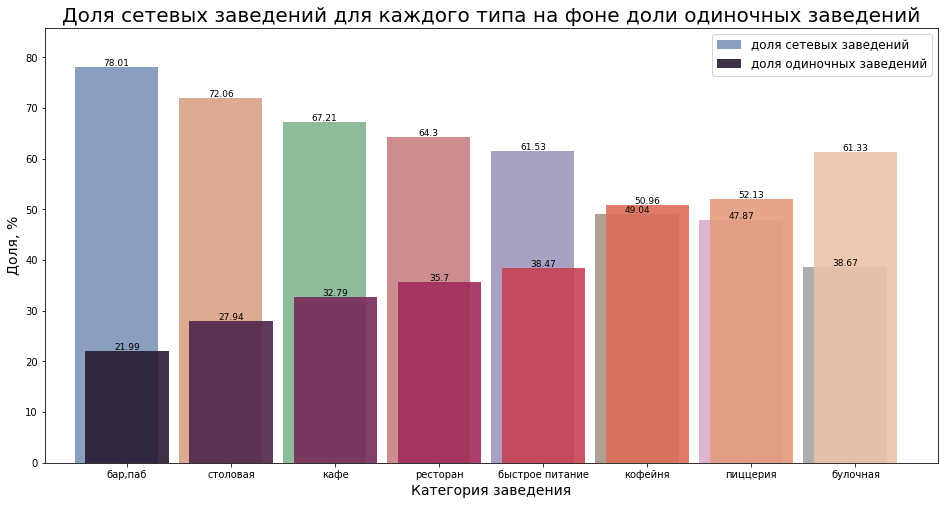

In [39]:
fig, ax = plt.subplots(figsize=(16,8))

sns.barplot(
            data=chain_no_chain,
            x='category',
            y='net_share',
            palette ='deep',
            alpha=0.7,
            label='доля сетевых заведений'
           )

for patch in ax.patches:
    patch.set_x(patch.get_x() - 0.1)   

sns.barplot(
            data=chain_no_chain,
            x='category',
            y='one_share',
            palette ='rocket',
            alpha=0.9,
            label='доля одиночных заведений'
           )

ax.set_title('Доля сетевых заведений для каждого типа на фоне доли одиночных заведений', fontsize=20)
ax.set_xlabel('Категория заведения', fontsize=14)
ax.set_ylabel('Доля, %', fontsize=14)
ax.margins(0.05, 0.1)
ax.legend(fontsize=12, loc='upper right')

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(), horizontalalignment='center', fontsize = 9)

plt.show()

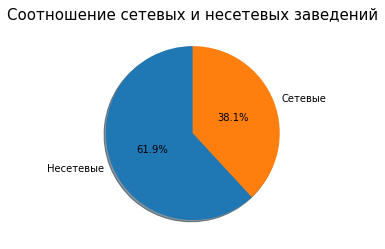

In [40]:
# построим круговой график соотношения сетевых к несетевым заведениям
places_chain = places.groupby('chain_place')['name'].count().reset_index().sort_values(by='name', ascending=False)
labels=['Несетевые', 'Сетевые']
fig, ax = plt.subplots()
ax.pie(places_chain['name'], labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, pctdistance=0.5)
plt.title("Соотношение сетевых и несетевых заведений", fontsize=15);

Несетевые заведения составляют более 61% заведений Москвы.

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

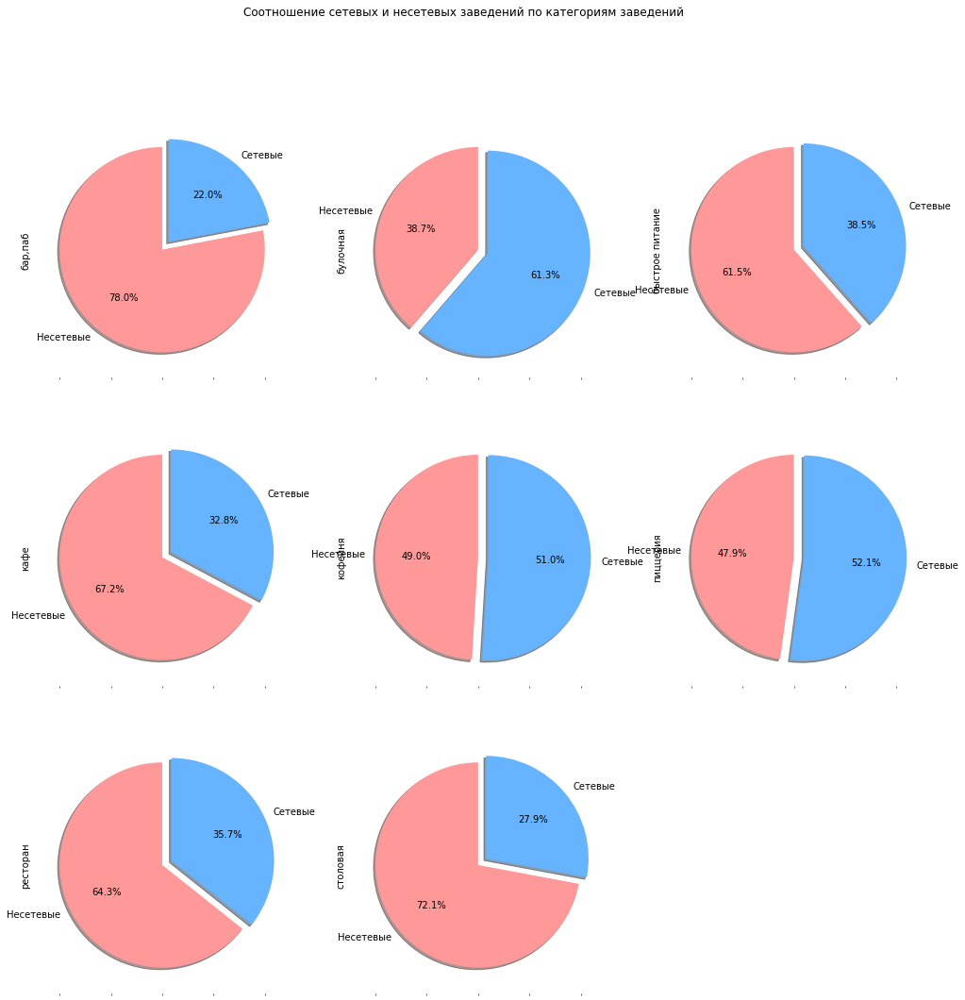

In [41]:
#выведем соотношение сетевых и несетевых заведений по типу категории
colors = ['#ff9999','#66b3ff']
explode = (0.0, 0.1) 
places.pivot_table(columns='category', index='chain', values='name', aggfunc='count').plot(kind='pie',
    subplots=True,
    figsize=(17, 17), autopct='%.1f%%', shadow=True, startangle=90, colors=colors, explode=explode,
    legend=False,
    layout=(3, 3),
    labels=['Несетевые', 'Сетевые'],
    title='Соотношение сетевых и несетевых заведений по категориям заведений');

**Вывод:** 

Больше всего кафе - 2378 единиц, далее рестораны 2043 единиц, кофейни 1413 единиц, бары 765 единиц. Процент кафе составляет 28%, ресторанов чуть меньше 24% и кофейин 16,8 %, что составляет почти 70% от общего количества. Остальные 30 % разделили между собой остальные категории. Больше всего сетевых заведений в категориях:булочная более 61%, пицерия 52% и кофейня 51%. Мало сетей в категориях: бар, паб -78%, столовая 72%, кафе 67%, рестораны 64,3%.

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [42]:
#соберем данные по посадочным местам
places['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

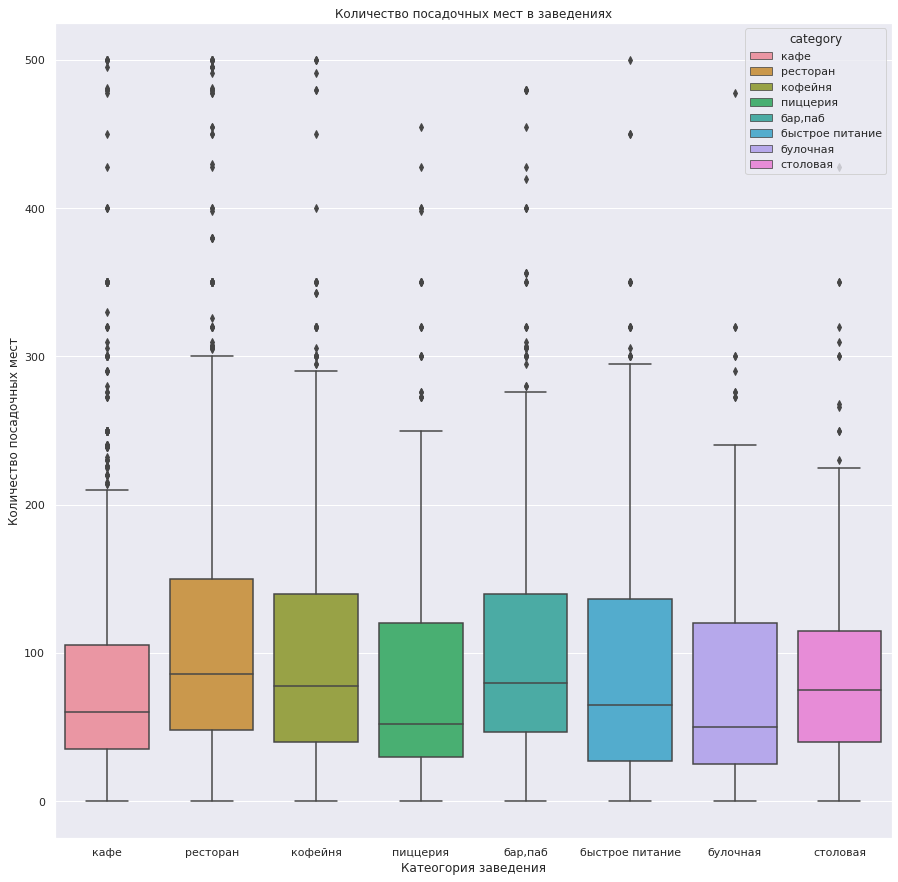

In [107]:
#визуализируем данные по посадочным местам по зеведениям, посмотрим выбросы
sns.set_palette("crest")
sns.boxplot(y='seats', x='category', data=places, hue="category", dodge=False)
sns.set(rc={'figure.figsize':(20,20)})
plt.title('Количество посадочных мест в заведениях')
plt.xlabel('Катеогория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

Много выбросов, важно убрать их. Возьмем за основу 500 мест для посадки.

In [44]:
print('Количество заведений с числом мест больше 500:', places[places['seats'] > 500]['name'].count())

Количество заведений с числом мест больше 500: 56


In [45]:
#Мест мало с таким выбрасом, так что удалю данные выбросы
places_seats_500 = places[places['seats'] > 500]
places = places.query('index not in @places_seats_500.index')
print('Заведения с посадочными местами больше 500:', places[places['seats'] > 500]['name'].count())
print('Заведения с посадочными местами менее 500:', places[places['seats'] < 500]['name'].count())

Заведения с посадочными местами больше 500: 0
Заведения с посадочными местами менее 500: 4715


In [46]:
print('Заведения с посадочными местами менее 500:', places[places['seats'] < 500]['name'].count())

Заведения с посадочными местами менее 500: 4715


In [47]:
# изучим данные по кол-ву посадочных мест по категориям заведений уже с учетом отсечения выбросов
places.groupby('category')['seats'].describe().round(2).reset_index()

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",457.0,108.95,93.28,0.0,47.00,80.0,140.00,480.0
1,булочная,147.0,85.74,87.35,0.0,25.00,50.0,120.00,478.0
2,быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
3,кафе,1203.0,89.42,88.81,0.0,35.00,60.0,105.50,500.0
4,кофейня,739.0,100.43,90.99,0.0,40.00,78.0,140.00,500.0
5,пиццерия,423.0,87.91,85.48,0.0,30.00,52.0,120.00,455.0
6,ресторан,1257.0,114.90,96.96,0.0,48.00,86.0,150.00,500.0
7,столовая,162.0,89.72,77.27,0.0,40.00,75.0,115.00,428.0


In [48]:
category_seats = places[places['seats'] !=0].groupby(['category','seats'],as_index=False)[['name']].count()
category_seats.columns = ['category', 'seats','number']

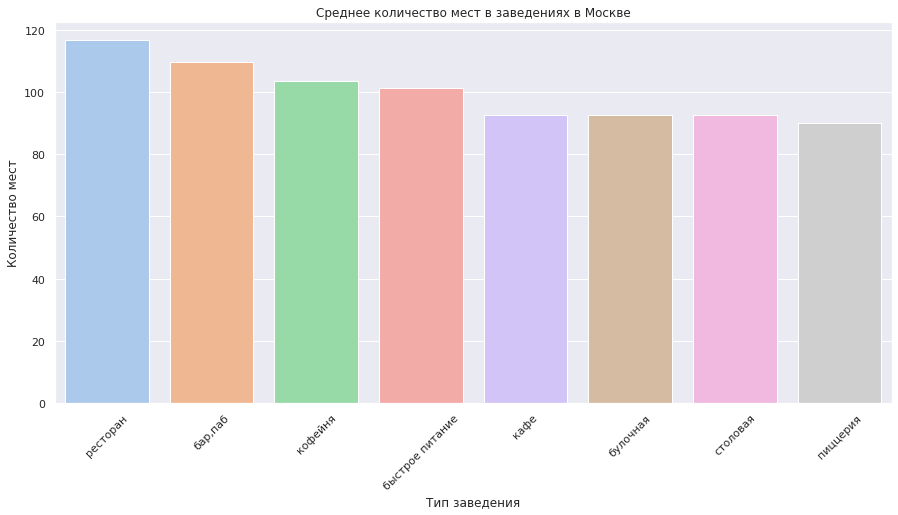

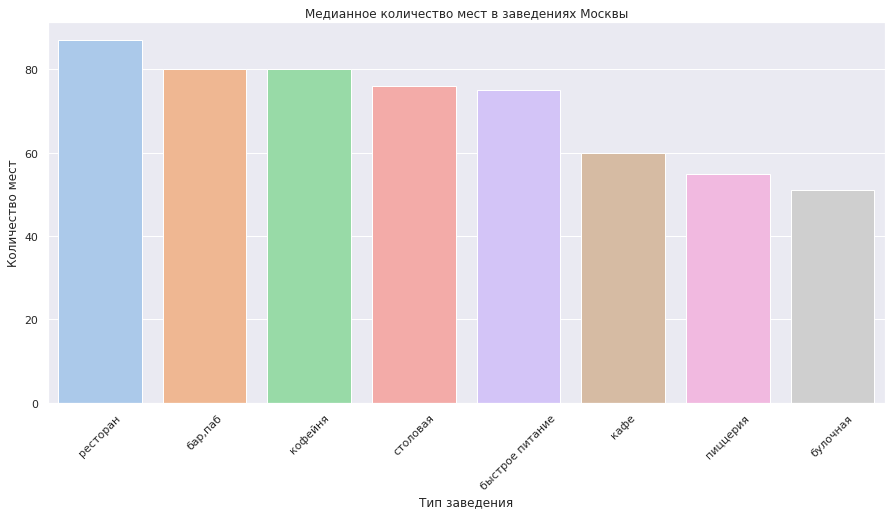

In [49]:
#сгруппируем данные для визуализации
seats_mean = places[places['seats'] != 0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False)
seats_median = places[places['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)

# визуалихируем по среднему значению посадочных мест
f, ax = plt.subplots(figsize=(15, 7))

ax = sns.barplot(data = seats_mean, x = 'category', y = 'seats', palette='pastel')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество мест в заведениях в Москве')
plt.xticks(rotation=45)
plt.show()

#визуализируем по медианному значению посадочны метс
f, ax = plt.subplots(figsize=(15, 7))

ax = sns.barplot(data=seats_median, x='category', y='seats', palette='pastel')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

In [50]:
category_seats1 = places[places['seats'] == 0]
category_seats1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
84,meat doner kebab,булочная,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0,False,улица лескова,True
177,арамье,булочная,"москва, улица 800-летия москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0,True,улица 800-летия москвы,False
196,донер-шашлык,ресторан,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0,False,улица лескова,True
203,тандыр № 1,кафе,"москва, улица лескова, 22г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0,True,улица лескова,True
211,неаполитан пицца,кафе,"москва, улица пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0,False,улица пришвина,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,бико,булочная,"москва, улица симоновский вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,NaN,NaN,NaN,NaN,0,0.0,False,улица симоновский вал,False
8168,чайхана уч кудук,кофейня,"москва, улица симоновский вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,NaN,NaN,NaN,NaN,0,0.0,False,улица симоновский вал,False
8172,масса кофе,кофейня,"москва, холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,NaN,155.0,0,0.0,False,холодильный переулок,False
8336,сочная шаурма в кузьминках,быстрое питание,"москва, волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,NaN,Средний счёт:120–130 ₽,125.0,NaN,0,0.0,False,волгоградский проспект,True


**Вывод:**

В данных были выросы по кол-ву посладчных мест, возможно связанные с некорректным введением данных. Убрали выбросы в размерее 1% от общего кол-ва заведений. С учетом выбрасов и некореектности данных, которые возможны и после удаления ыбрасов, произвела расчет среднего и медианного кличества мест в заведениях. Согласно вышесказанному, правильней ориентироваться на медианное значение. По этим данным: кол-во мест в реторанах порядкам 90 мест, в пабах и кофейнях около 80, столовых и местах быстрого питания около 75 и т.д.


### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [51]:
places_chain = places[places['chain_place'] == True]
places_15 = places_chain.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
places_15 = places_15.rename(columns={'district':'count'})
places_15 = places_15.sort_values('count', ascending = False).reset_index().head(15)
places_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,118
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,70
4,яндекс лавка,4.00,ресторан,68
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,теремок,4.10,ресторан,38


In [52]:
print('Всего заведений в Топ-15:', places_15['count'].sum())

Всего заведений в Топ-15: 811


In [53]:
# построим график ТОП-15 заведений Москвы
fig = px.bar(places_15, 
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000)
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()                

In [54]:
# визуализируем категории ТОП-15 заведений Москвы и их кол-во
fig = px.bar(places_15,
             x='count', 
             y='category',
             color='category',
             text = 'name'
            )

fig.update_layout(title='Количество заведений по категориям в топ-15 популярных сетей Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                   yaxis={'categoryorder':'total ascending'},
                   width=900,
                   height=500
                 )
fig.show()

**Вывод:**

Всего в топ-15 вошло 811 сетевых заведений Москвы. Самые популярные сетевые заведения: Шоколадница, Доминос Пицца, додо Пицца, one price coffee, яндекс лавка. Данные типы заведений относятся к ккофейням, их более 300, ресторанам = 160, либо пиццериям = 150 и кафе = 145 единицам. 

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [55]:
#выведем названия всех уникальных админитсртративных районов
print(places['district'].unique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [56]:
district_places = places.groupby(['district', 'category']).agg({'rating': 'median', 'name': 'count'})
district_places = district_places.sort_values('rating', ascending=False).reset_index()
district_places = district_places.rename(columns={'name': 'count'})
district_places

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.50,364
1,Западный административный округ,"бар,паб",4.45,46
2,Северо-Западный административный округ,"бар,паб",4.40,23
3,Северный административный округ,"бар,паб",4.40,66
4,Центральный административный округ,ресторан,4.40,670
...,...,...,...,...
67,Северный административный округ,быстрое питание,4.15,58
68,Восточный административный округ,быстрое питание,4.15,70
69,Юго-Восточный административный округ,быстрое питание,4.10,67
70,Западный административный округ,быстрое питание,4.10,62


In [57]:
fig = px.bar(district_places,
             x='count',
             y='district',
             color='category'
            )
fig.update_layout(title = 'Количество заведений каждой категории по районам Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder': 'total ascending'}
)
fig.show()

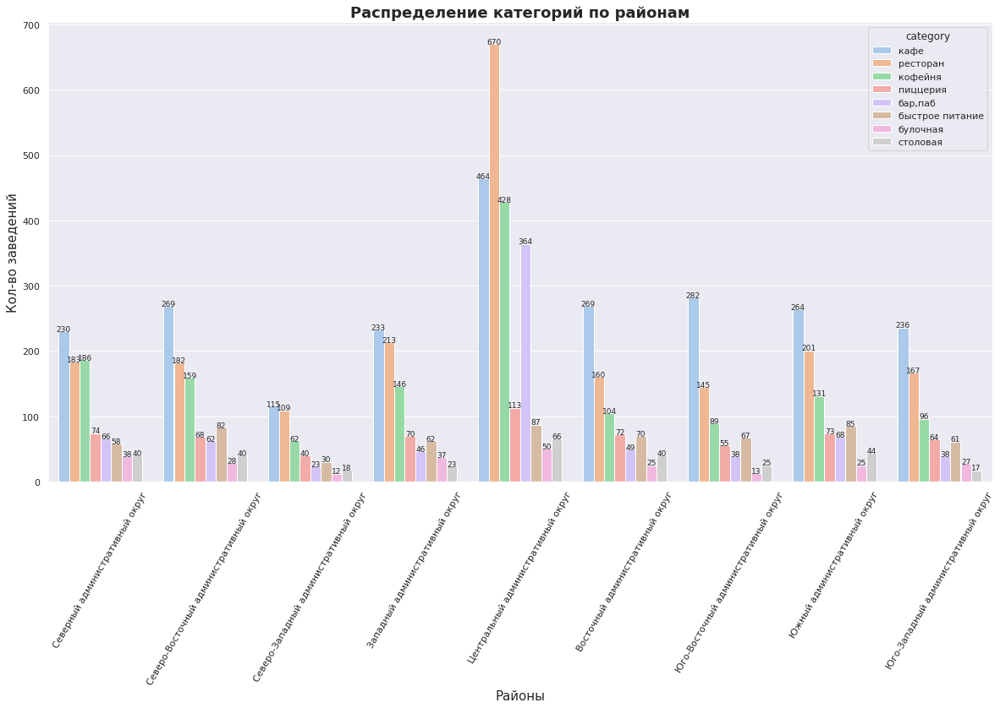

In [58]:
#визуализируем данные по распределнию категорий заведений в районах
plt.figure(figsize=(20, 10))
ax = sns.countplot(x='district', hue='category', data=places, palette='pastel')
plt.xticks(rotation=60)
ax.set_xlabel('Районы', fontsize = 15)
ax.set_ylabel('Кол-во заведений', fontsize = 15)
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(),
             horizontalalignment='center', fontsize = 9)
ax.set_title('Распределение категорий по районам', fontsize = 18, fontweight='bold');


**Вывод:**

Количество районов - 9. Данных нет по ЗАО г. Москвы и Новой Москве.

По общему количеству заведений лидирует ЦАО Москвы, здесь больше всего рестаранов - 670 единиц, кафе-464 единиц, кофейн - 428 единиц и бар, пабоп- 364 единицы. 

В целом по Москве привалируют по количеству заведений - рестораны, меньше всего столовых и булочных.

Менее всего представлены заведения в Северо-Западном административном округе около 450 заведений.

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [59]:
category_mean_rating = places.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
category_mean_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [60]:
# визуализируем средние рейтинги по категориям заведений
fig = px.bar(category_mean_rating,
             x='rating',
             y='category',
             text='rating',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений', xaxis_title='Рейтинг',
                  yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

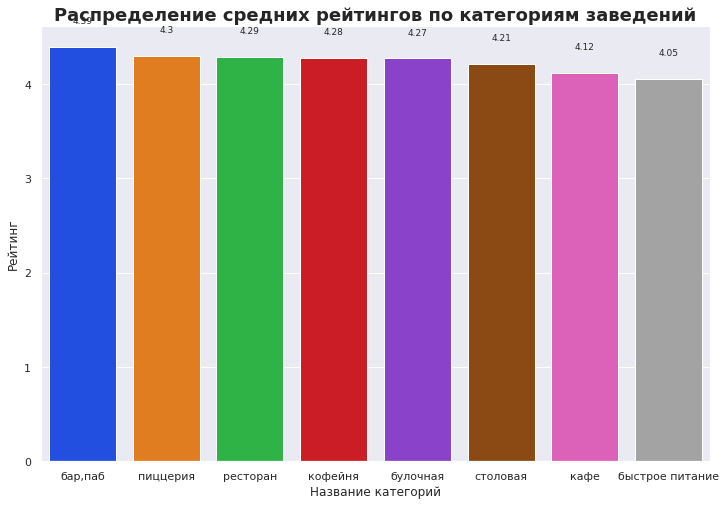

In [61]:
# визуализируем средние рейтинги по категориям заведений - второй вариант 
plt.figure(figsize=(12,8))
fig = sns.barplot(x='category', y='rating', data=category_mean_rating, palette="bright")
fig.set_xlabel('Название категорий')
fig.set_ylabel('Рейтинг')
fig.set_title('Распределение средних рейтингов по категориям заведений', fontsize = 18, fontweight='bold')
for rect in fig.patches:
    fig.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.25,rect.get_height(), horizontalalignment='center', fontsize = 9)
plt.show()

**Вывод:**
Средний рейтинг заведений по их категориям вырирует от 4.0 до 4.4. Высшая средняя оценка у баров, пабов, низшая у заведений быстрого питания.

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [62]:
rating_district = places.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_district.reset_index()
rating_district

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [63]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [64]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [65]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color = 'OrRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

    Карта визуально показывает где самый высокий рейтинг - ЦАО район г. Москвы

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [66]:
# создаем карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

Из построенной карты видно, что большенство заведений расположены в центре Москвы

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [67]:
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,True,правобережная улица,False


In [68]:
#определим топ-15 улиц Москвы по кол-ву заведений
msc_streets = places[places['street'].notnull()]
temp = msc_streets.groupby('street').count().sort_values(by='category', ascending=False).head(15).reset_index()
street_top_15 = list(temp['street'])
temp

,street,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,is_24_7
0,проспект мира,183,183,183,183,175,183,183,183,71,78,68,9,183,88,183,183
1,профсоюзная улица,122,122,122,122,115,122,122,122,45,47,41,6,122,91,122,122
2,ленинский проспект,107,107,107,107,99,107,107,107,40,45,35,9,107,80,107,107
3,проспект вернадского,97,97,97,97,93,97,97,97,37,48,43,4,97,58,97,97
4,дмитровское шоссе,88,88,88,88,86,88,88,88,39,44,38,5,88,55,88,88
5,каширское шоссе,77,77,77,77,71,77,77,77,23,37,31,5,77,53,77,77
6,варшавское шоссе,76,76,76,76,68,76,76,76,23,30,23,5,76,41,76,76
7,ленинградский проспект,72,72,72,72,67,72,72,72,42,41,32,6,72,53,72,72
8,ленинградское шоссе,70,70,70,70,67,70,70,70,34,38,35,2,70,39,70,70
9,мкад,65,65,65,65,50,65,65,65,8,8,8,0,65,0,65,65


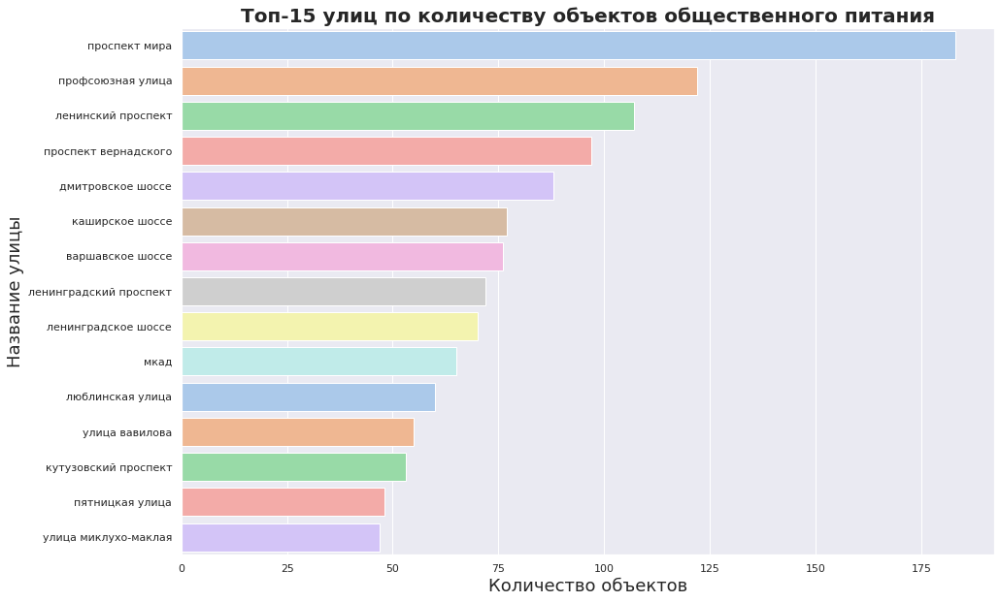

In [69]:
# визуализируем данные
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='category', y='street', data=temp, palette="pastel")
ax.set_title('Топ-15 улиц по количеству объектов общественного питания', fontsize = 20, fontweight='bold')
ax.set_xlabel('Количество объектов', fontsize = 18)
ax.set_ylabel('Название улицы', fontsize = 18)
plt.show()

**Вывод:**

Более чем 175 заведение находятся на проспекте мира, на ул. Профсоюзная порядком 120, а меньше всего из топ-15 на улице Миклухо-Маклая.

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [70]:
# создадим список с группировкой заведений по улицам и выведем кол-во объектов с одним бщепитом
temp_1 = places.groupby('street').count().sort_values(by='name', ascending=True)
temp_1_streets = temp_1[temp_1['name'] == 1].index.to_list()
len(temp_1_streets)

457

In [71]:
# проверим еще раз - точно ли все расчитано
# создадим список с группировкой заведений по улицам
temp1=msc_streets.groupby('street').count().sort_values(by='category', ascending=False).reset_index()

# выведем данные о количестве улиц с одним объектом общественного питания
print("Улиц с одним объектом общепита: {}".format(temp1[temp1['name'] == 1].shape[0]))


Улиц с одним объектом общепита: 457


In [72]:
#создадим датафрейм с данными по этим объектам
temp_1_streets = places.query('street in @temp_1_streets')
temp_1_streets.head(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,False,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,False,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,True,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,True,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,True,ландшафтный заказник лианозовский,False
64,testo мания,кофейня,"москва, лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,False,лианозовский парк культуры и отдыха,False
71,cofefest,кофейня,"москва, новгородская улица, 23а",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN,True,новгородская улица,False
73,веранда,ресторан,"москва, парк алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,True,парк алтуфьево,False
97,жигулевское,"бар,паб","москва, бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,False,бибиревская улица,False
103,тетри,быстрое питание,"москва, лианозовский проезд, вл1",Северо-Восточный административный округ,вт-вс 09:00–19:00,55.896922,37.554929,4.0,средние,Средний счёт:150–250 ₽,200.0,NaN,0,NaN,False,лианозовский проезд,False


In [73]:
# посмотрим районы,в  которых располагаются данные заведения
fig_3 = px.bar(temp_1_streets.groupby('district').count().reset_index().sort_values(by='name', ascending=False),
                y='name',
                x='district',
                text='name',
                color_discrete_sequence =['#f0acac']*len(temp_1_streets.groupby('district').count().reset_index().sort_values(by='name', ascending=False)),
                title='Количество улиц с одним объектом общепита по районам',
                labels={'district':'Район', 'name':'Количество'}
               )
fig_3.update_xaxes(tickangle=45)
fig_3.show()

In [74]:
# визуалихируем данные по расположению одиночных заведений на одной улице
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(m6)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
temp_1_streets.apply(create_clusters, axis=1)

# выводим карту
m6

In [75]:
# построим график соотношения кол-ва сетевых и несетевых одиночных объектов 
fig = px.bar(temp_1_streets.groupby('chain_place').count().reset_index().sort_values(by='name', ascending=False),
                y='name',
                x='chain_place',
                text = ['Несетевые', 'Сетевые'],
                color_discrete_sequence =['#f0acac']*len(places.groupby('chain_place').count().reset_index().sort_values(by='name', ascending=False)),
                title='Количество сетевых и несетевых объектов',
                labels={'chain_place':'Тип заведения', 'name':'Количество'}
               )
fig.show()

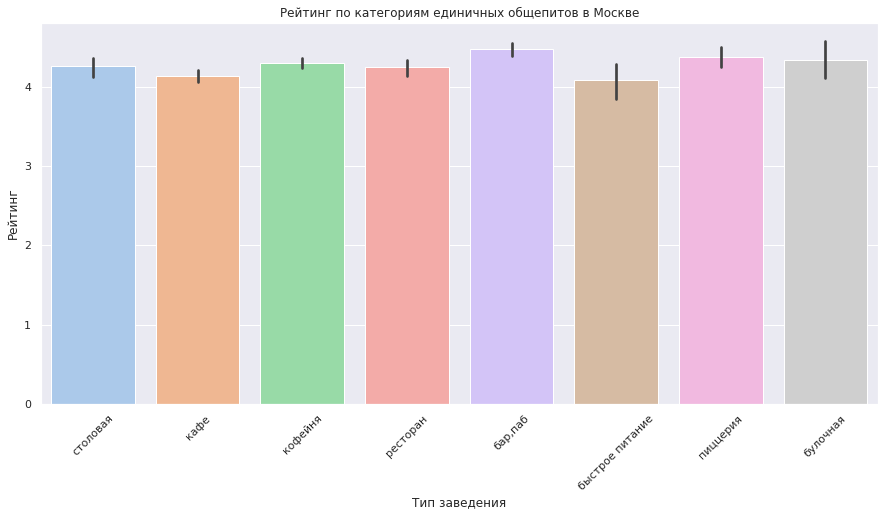

In [76]:
#визуализируем данные по типу заведений и их рейтингу
f, ax = plt.subplots(figsize=(15, 7))

ax = sns.barplot(data=temp_1_streets, x='category', y='rating', palette='pastel')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Рейтинг')
ax.set_title('Рейтинг по категориям единичных общепитов в Москве')
plt.xticks(rotation=45)
plt.show()

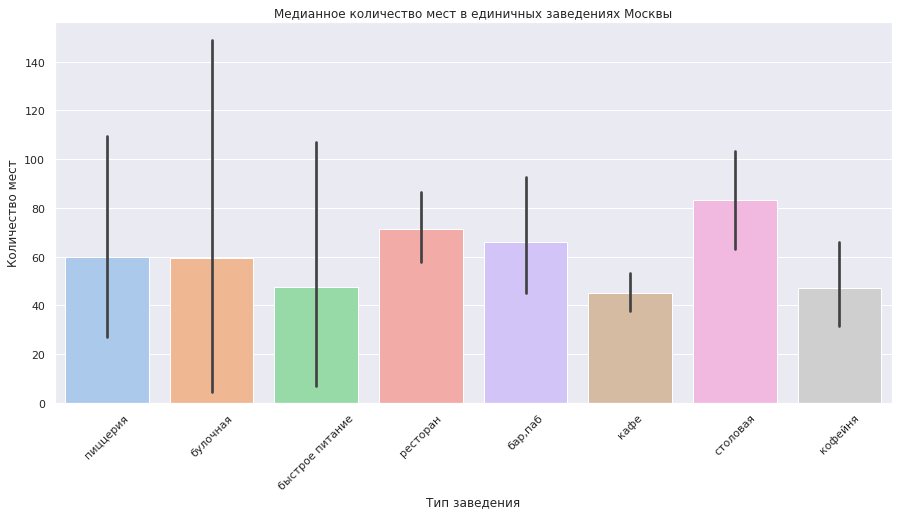

In [77]:
#визуализируем по медианному значению посадочны метс
f, ax = plt.subplots(figsize=(15, 7))
temp_1_streets = temp_1_streets.sort_values(by="seats", ascending=False)

ax = sns.barplot(data=temp_1_streets, x='category', y='seats', palette='pastel')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в единичных заведениях Москвы')
plt.xticks(rotation=45)
plt.show()


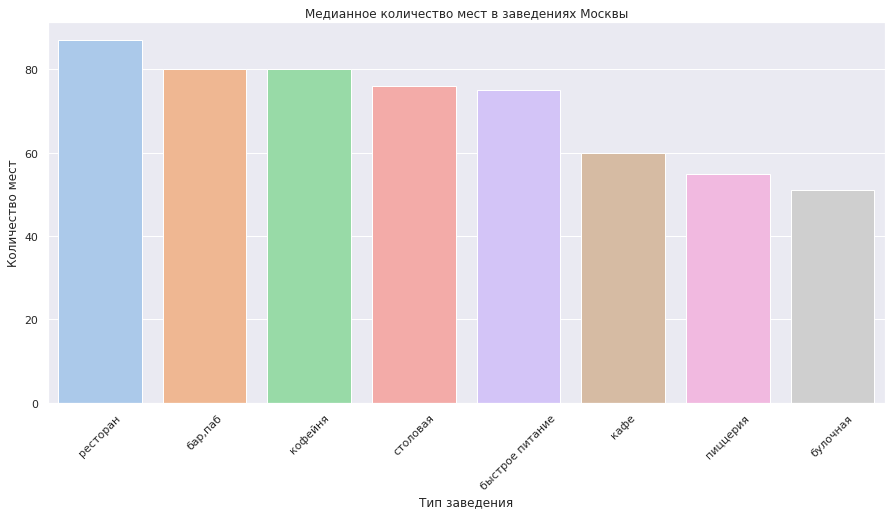

In [78]:
#визуализируем по медианному значению посадочны метс
f, ax = plt.subplots(figsize=(15, 7))

ax = sns.barplot(data=seats_median, x='category', y='seats', palette='pastel')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

In [79]:
median_pay = temp_1_streets.groupby('district')['middle_avg_bill'].median().reset_index()
median_pay

,district,middle_avg_bill
0,Восточный административный округ,475.0
1,Западный административный округ,600.0
2,Северный административный округ,575.0
3,Северо-Восточный административный округ,462.5
4,Северо-Западный административный округ,1250.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,1050.0
7,Юго-Западный административный округ,400.0
8,Южный административный округ,350.0


In [80]:
# карта Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = median_pay,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'OrRd',
    fill_opacity=0.8,
    legend_name = 'Средний чек одиночных заведений по районам',
).add_to(m)

m

**Вывод:**

Большое количество улиц с одним единственным заведением расположены в ЦАО г. Москвы. Визуализации картой подтверждает эти данные.

Можно увидеть при сравнении медианное кол-ва посадочных мест по всем заведениям г. Москвы, с 'одиночками', это то, что, данные заведения меньше по размеру. Так например, в одиночных заведениям паб порядком 65 мест, а во всех заведниях более 80. Кафе в одиночках 45 мест, в общих данных 60. Кофейня 45 против 60. Быстрое питание 45 против 70 мест.

Согласно данным в три раза больше несетевых общепитов, которые расположены в единственном экземпляре на улице. 

Средний чек по одиночным общепитам самый высокий в Северо-Западном административном округе.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [81]:
median_bill = places.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [82]:
# карта Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'OrRd',
    fill_opacity=0.8,
    legend_name = 'Средний чек заведений по районам',
).add_to(m)

m

**Вывод:**

Cамый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном и Восточном административных округах. Из таблицы выше видно, что средний чек округов вокруг центрального в среднем отличается в 1,5 - 2 раза.

Отличие цен от ЦАО не в том, что удаленность от центра Москвы. В Западном цены то равные ЦАО. Здесь цены зависят от уровня жизни по районам. На качество жизни в районе влияет многое - экология, удосьбства и пр. А также по этим удобствам оценивается недвижимость в городе. Где цены на недвижимость выше, там живут и люди с более высоким доходом, поэоому и на них ориентируются по цене в общепитах. 

### Общие выводы

- Всего имеем: 8 категорий: кафе,ресторан,кофейня, пиццерия, бар-паб, быстрое питание, булочная, столовая.
- Больше всего кафе в Москве - 2376 единиц, далее рестораны 2043 единиц, кофейни 1413 единиц, бары 765 единиц.
- Кафе составляют большую долю в 28% от общего числа заведений Москвы, самая меньшая доля заведений - булочные всего 3%.
- Несетевые заведения составляют более 61% заведений Москвы и составляют 5169 единиц, сетевых же 3177 единиц. Больше всего сетевых заведений в категориях: булочная более 61%, пицерия 52% и кофейня 51%. Мало сетей в категориях: бар, паб - 78%, столовая 72%, кафе 67%, рестораны 64,3%.
- Среднее кол-во посадочных мест около 75, однако есть заведения на 1288 мест. Есть заведения без сидящих мест, возмоно они работают на вынос. Кол-во мест в реторанах порядкам 90 мест, в пабах и кофейнях около 80, столовых и местах быстрого питания около 75 и т.д.
- Анализ топ-15 сетевых заведений Москвы показал: всего 811 сетевых заведений  по Москве. Самые популярные из них : Шоколадница, Доминос Пицца, додо Пицца, one price coffee, Яндекс лавка. Данные типы заведений относятся к кофейням, их более 300, ресторанам = 160, либо пиццериям = 150 и кафе = 145 единицам. 
- Анализ заведений по разбивки на административные округи Москвы показал данные по 9 округам. По общему количеству заведений лидирует ЦАО Москвы, здесь больше всего рестаранов - 670 единиц, кафе-464 единиц, кофейн - 428 единиц и бар, пабов- 364 единицы. СЗАО является округом с меньшим количеством общественных заведений. 
- Анализ заведений по среднему рейтингу вырирует от 4.0 до 4.4. Высшая средняя оценка у баров, пабов, низшая у заведений быстрого питания.Самый высокий рейтинг в целом по заведениям в ЦАО район г. Москвы.
- Самой популярной улицей в Москве стал Проспект мира по кол-ву заведений - 183 общепита.Есть также и одиночные общепиты, расположенные в единственном экземпляре на одной улице- их кол-во 457. И таких заведений вновь больше всего в ЦАО. Это связано с общей тенденцией к большому размещению общепитов в ЦАО.
- Можно увидеть при сравнении медианное кол-ва посадочных мест по всем заведениям г. Москвы, с 'одиночками', это то, что, данные заведения меньше по размеру. Так например, в одиночных заведениям паб порядком 65 мест, а во всех заведниях более 80. Кафе в одиночках 45 мест, в общих данных 60. Кофейня 45 против 60. Быстрое питание 45 против 70 мест. Согласно данным в три раза больше несетевых общепитов, которые расположены в единственном экземпляре на улице. Средний чек по одиночным общепитам самый высокий в Северо-Западном административном округе.
- Самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Из данных видно, что средний чек округов вокруг центрального в среднем отличается в 1,5 - 2 раза.

## Шаг 4. Детализируем исследование: открытие кофейни


**Описание:**

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». 
Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. 
Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. 
Попробуйте определить, осуществима ли мечта клиентов.


### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?


In [83]:
# создадим таблицу только с кофейнями
coffee_places = places[places['category'] == 'кофейня']
print('Всего кофеен в Москве:', coffee_places['name'].count())
print('Количество уникальных кофеен всего:', coffee_places['name'].nunique())


Всего кофеен в Москве: 1401
Количество уникальных кофеен всего: 822


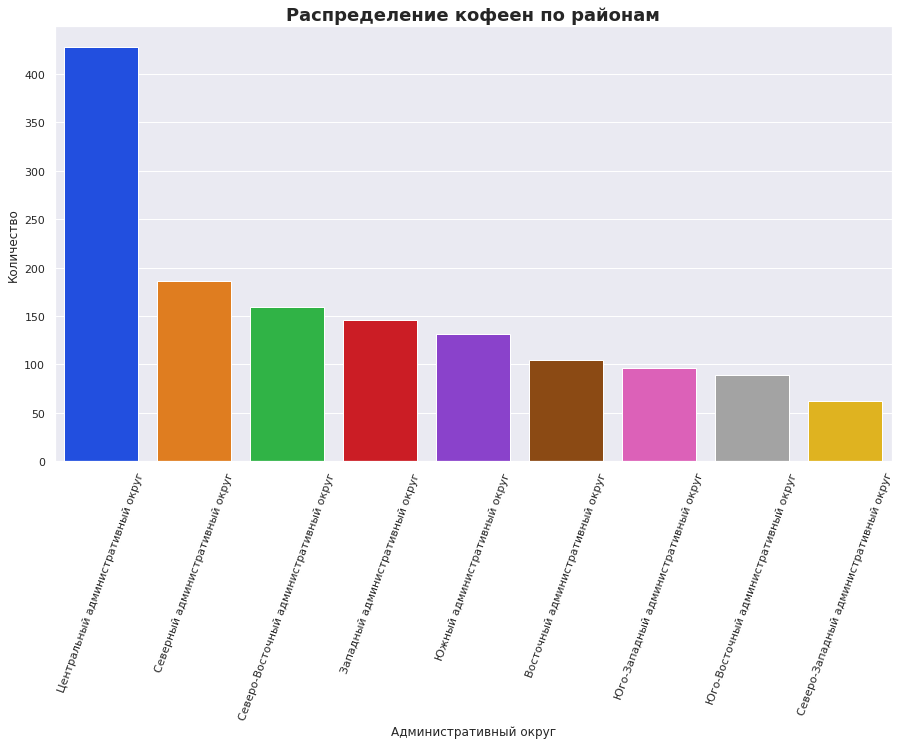

In [84]:
#распредление коффен по районам Москвы
plt.figure(figsize=(15, 8))
sns.countplot(x='district', data=coffee_places, palette="bright", order=coffee_places['district'].value_counts().index)
plt.xticks(rotation=70)
plt.title('Распределение кофеен по районам', fontsize = 18, fontweight='bold')
plt.xlabel('Административный округ')
plt.ylabel('Количество')
plt.show()

In [85]:
# создаем карту
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_places.apply(create_clusters, axis=1)

# выводим карту
m1

Итого:
    Всего 1401 заведение в категории кофейня. Большая часть заведений располагается в Центральном районе - более 420 единиц. Меньше всего заведений - в восточной и южной частях города.

### Есть ли круглосуточные кофейни?

In [86]:
coffee_places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,True,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,True,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,True,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,True,улица дыбенко,False


In [87]:
# выведем кол-во круглосуточных кофеен
coffee_places_24_7 = coffee_places[coffee_places['is_24_7'] == True]
print('Всего круглосуточных кофеен:', len(coffee_places_24_7))
print('Количество уникальных круглосуточных кофеен всего:', coffee_places_24_7['name'].nunique())

Всего круглосуточных кофеен: 59
Количество уникальных круглосуточных кофеен всего: 22


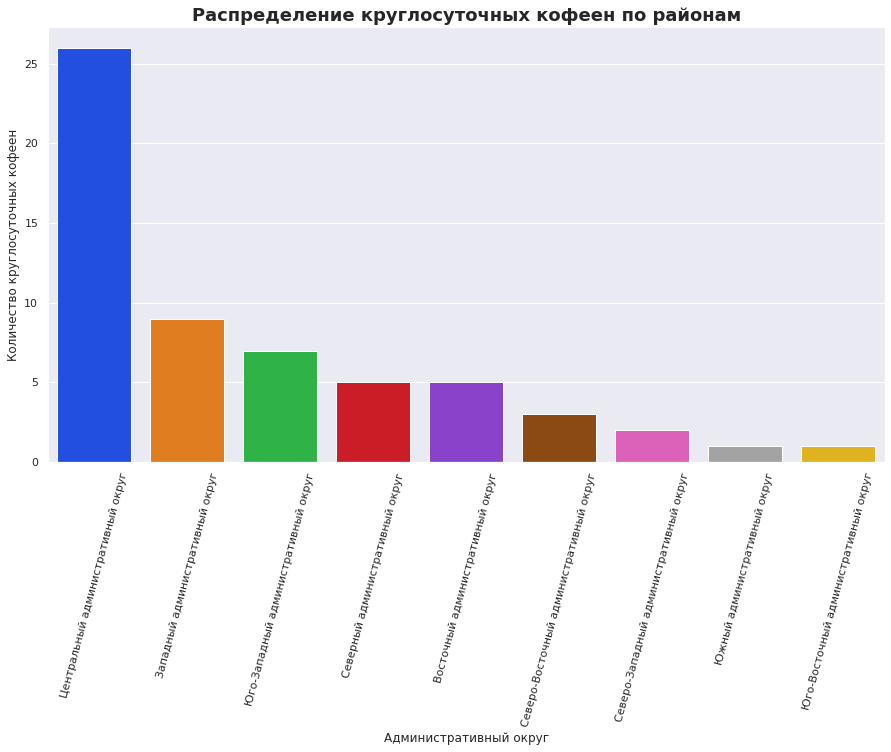

In [88]:
#распредление коффен по районам Москвы
plt.figure(figsize=(15, 8))
sns.countplot(x='district', data=coffee_places_24_7, palette="bright", order=coffee_places_24_7['district'].value_counts().index)
plt.xticks(rotation=75)
plt.title('Распределение круглосуточных кофеен по районам', fontsize = 18, fontweight='bold')
plt.xlabel('Административный округ')
plt.ylabel('Количество круглосуточных кофеен')
plt.show()

Итог: всего 59 круглосуточных кофеен, из них уникальных 22 единицы. Больше всего таких кофеен  в ЦАО г. Москвы (это связано с тем, что люди любят погулять по ночной Москве где располодены главные ее достопримечательности), меньше всего в Юго-Восточном и Южном а.о. (это спальные районы).

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [89]:
coffee_mean_rating = coffee_places.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_mean_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [90]:
# визуализируем средние рейтинги по районам
fig = px.bar(coffee_mean_rating,
             x='rating',
             y='district',
             text='rating',
             color='district'
            )
fig.update_layout(title='Распределение средних рейтингов по районам г. Москвы', xaxis_title='Рейтинг',
                  yaxis_title='Район')
fig.update_xaxes(range=[4, 4.5])
fig.show()

In [91]:
# создаём карту
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_mean_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color = 'OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m2)

# выводим карту
m2

Вывод: самый высокий рейтинг у кафеен в ЦАО и Северо-Западном а.о. - 4.34-4.33, самый низкий рейтинг 4.19 у Западного административного округа. 

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


In [92]:
coffee_cup = coffee_places.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(coffee_cup)

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [93]:
coffee_cup_price = round(coffee_cup['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_cup_price)

Средняя стоимость чашки кофе в Москве: 171.23


In [94]:
# визуализируем среднюю стоимость чашки кофе в  Москве по округам  
fig = px.bar(coffee_cup,
             x='middle_coffee_cup',
             y='district',
             text='middle_coffee_cup',
             color='district'
             )
fig.update_layout(title='Распределение средней стоимости чашки кофе в кофейнях по округам', xaxis_title='Стоимость кофе',
                  yaxis_title='Округ')
fig.update_xaxes(range=[0, 200])
fig.show()

In [95]:
# создаём карту
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color = 'OrRd',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по округам',
).add_to(m3)

# выводим карту
m3

**Вывод:**

Средняя стоимость чашки кофе по всей Москве равна 171 единицам. Самое дорогое кофе можно попить в ЗАО и ЦАО, а самое дешевое за 151 ед. в ЮВАО. Я бы ориентировалась на среднюю стоимость по каждому району, чтобы цена была конкурентная, в зависимости от места расположения будущего кафе конечно. 

### Сетевые и несетевые кафе конкуренты


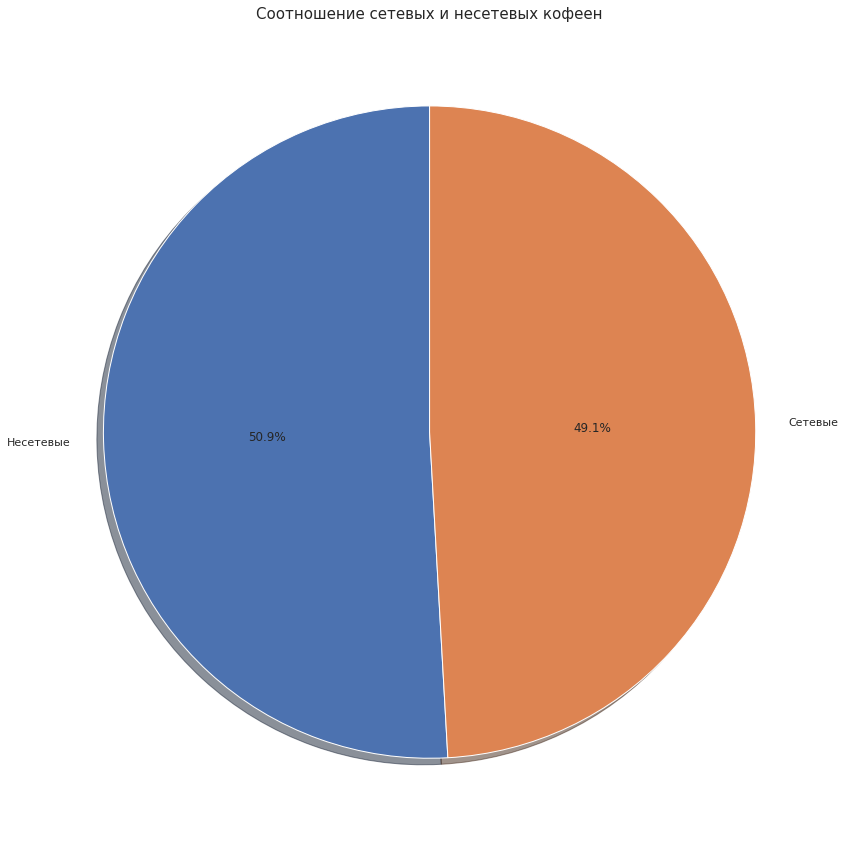

In [96]:
# построим круговой график соотношения сетевых к несетевым заведениям
coffee_chain = coffee_places.groupby('chain_place')['name'].count().reset_index().sort_values(by='name', ascending=False)
#labels = chain['chain_place']
labels=['Несетевые', 'Сетевые']
fig, ax = plt.subplots()
ax.pie(coffee_chain['name'], labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, pctdistance=0.5)
plt.title("Соотношение сетевых и несетевых кофеен", fontsize=15);

**Вывод:**
Проанализировав кафейни по их статутсу - сетевой и несетевой, можно сделать вывод, что они делятся примерно 50 на 50. В целом конкуренты будут часть сетевыми, часть единичными кафейнями.

### Количество мест в кафейне

In [97]:
#соберем данные по посадочным местам
coffee_places['seats'].describe()

count    739.000000
mean     100.433018
std       90.991761
min        0.000000
25%       40.000000
50%       78.000000
75%      140.000000
max      500.000000
Name: seats, dtype: float64

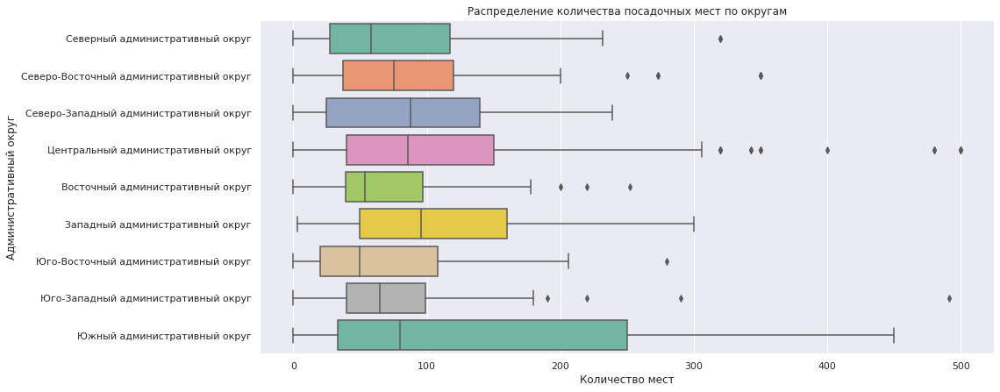

In [98]:
plt.figure(figsize=(15, 7))
ax = sns.boxplot(data=coffee_places, x='seats', y='district', palette="Set2")
plt.title('Распределение количества посадочных мест по округам')
plt.xlabel('Количество мест')
plt.ylabel('Административный округ')
plt.show()

**Вывод:**

Большим количеством мест в кафейне располагают кафейни в ЮАО г. Москвы (возможно это связано со стоимостью аренды, она в этом окреге дешевле). Самые маленькие кофейни в ЮЗАО. Срденне кол-во мест по Москве порядком 78 посадочных мест.

### Топ-15 кофеен Москвы

In [99]:
coffee_places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,True,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,True,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,True,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,True,улица дыбенко,False


In [100]:
#топ-15 кофеен Москвы
coffee_15 = coffee_places.groupby('name').agg({'rating': 'median', 'chain_place' : pd.Series.mode, 'district' : 'count'})
coffee_15 = coffee_15.rename(columns={'district':'count'})
coffee_15 = coffee_15.sort_values('count', ascending = False).reset_index().head(15)
coffee_15

,name,rating,chain_place,count
0,шоколадница,4.20,True,117
1,one price coffee,4.20,True,71
2,cofix,4.10,True,65
3,кофепорт,4.20,True,42
4,cofefest,4.00,True,31
5,кофемания,4.40,True,22
6,cinnabon,4.20,True,20
7,правда кофе,4.30,True,13
8,krispy kreme,4.30,True,9
9,кофейня,4.10,False,9


In [101]:
print('Кол-во кофеен в Топ-15:', coffee_15['count'].sum())

Кол-во кофеен в Топ-15: 437


In [102]:
# построим график ТОП-15 кофеен Москвы
fig = px.bar(coffee_15, 
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000)
fig.update_layout(title = 'Топ-15 популярных кофеен Москвы',
                  xaxis_title = 'Количество кофеен',
                  yaxis_title = 'Название кофейни',
                  showlegend = False)
fig.show()                

### Топ-50 кофеен по г. Москва и их рейтинг 

In [103]:
# создадим таблицу  c кофейнями с самым выскоим рейтингом
coffee_places1 = coffee_places.sort_values(by='rating', ascending=False).head(50)
coffee_places1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица маршала федоренко,False
5644,дворик невского,кофейня,"москва, западный административный округ, район...",Западный административный округ,"ежедневно, 10:00–20:00",55.679118,37.480924,5.0,NaN,NaN,NaN,NaN,0,NaN,False,западный административный округ,False
1284,стамбул дурум,кофейня,"москва, улица народного ополчения, 22",Северо-Западный административный округ,"ежедневно, 11:00–23:00",55.778556,37.479573,5.0,средние,Средний счёт:250–300 ₽,275.0,NaN,0,NaN,False,улица народного ополчения,False
1283,pique-nique,кофейня,"москва, 3-я радиаторская улица, 9",Северный административный округ,"ежедневно, 09:00–22:00",55.818584,37.490628,5.0,низкие,Цена чашки капучино:170–220 ₽,NaN,195.0,0,NaN,False,3-я радиаторская улица,False
1272,уголок,кофейня,"москва, улица космонавта волкова, 6а",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.815341,37.513262,5.0,NaN,NaN,NaN,NaN,1,180.0,True,улица космонавта волкова,False
5545,youtime,кофейня,"москва, электродная улица, 2, стр. 32",Восточный административный округ,"ежедневно, 08:30–21:00",55.754323,37.752520,5.0,NaN,NaN,NaN,NaN,0,90.0,False,электродная улица,False
5593,бабл дабл,кофейня,"москва, 2-я кабельная улица, 2, стр. 5",Юго-Восточный административный округ,NaN,55.748072,37.714132,5.0,NaN,NaN,NaN,NaN,0,NaN,False,2-я кабельная улица,False
5594,wild bean cafe,кофейня,"москва, суздальская улица, 15а",Восточный административный округ,NaN,55.744970,37.864105,5.0,NaN,NaN,NaN,NaN,1,16.0,True,суздальская улица,False
5910,family bakery,кофейня,"москва, ленинский проспект, 29, стр. 2",Южный административный округ,пн-пт 08:00–19:00,55.713982,37.591317,5.0,NaN,NaN,NaN,NaN,0,144.0,False,ленинский проспект,False
1307,nero bean coffee roastery,кофейня,"москва, ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.809720,37.507711,5.0,NaN,Цена чашки капучино:150–250 ₽,NaN,200.0,0,232.0,False,ленинградский проспект,False


In [104]:
# создаем карту отображающую 50 кофеен с самым высоким рейингом по Москве
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m5)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_places1.apply(create_marker, axis=1)
    
# выводим карту
m5


In [105]:
coffee_streets = coffee_places1[coffee_places1['street'].notnull()]
temp1 = coffee_streets.groupby('street').count().sort_values(by='category', ascending=False).head(15).reset_index()
street_top_15 = list(temp1['street'])
temp1

,street,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,chain_place,is_24_7
0,улица космонавта волкова,2,2,2,2,2,2,2,2,0,0,0,0,2,1,2,2
1,ходынский бульвар,2,2,2,2,2,2,2,2,0,1,0,1,2,2,2,2
2,бескудниковский бульвар,2,2,2,2,2,2,2,2,0,2,0,2,2,0,2,2
3,локомотивный проезд,2,2,2,2,2,2,2,2,1,1,0,1,2,1,2,2
4,ленинский проспект,2,2,2,2,2,2,2,2,0,0,0,0,2,1,2,2
5,улица василисы кожиной,1,1,1,1,1,1,1,1,0,0,0,0,1,0,1,1
6,светлогорский проезд,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1
7,северный административный округ,1,1,1,1,1,1,1,1,0,0,0,0,1,0,1,1
8,смольная улица,1,1,1,1,1,1,1,1,0,0,0,0,1,0,1,1
9,суздальская улица,1,1,1,1,0,1,1,1,0,0,0,0,1,1,1,1


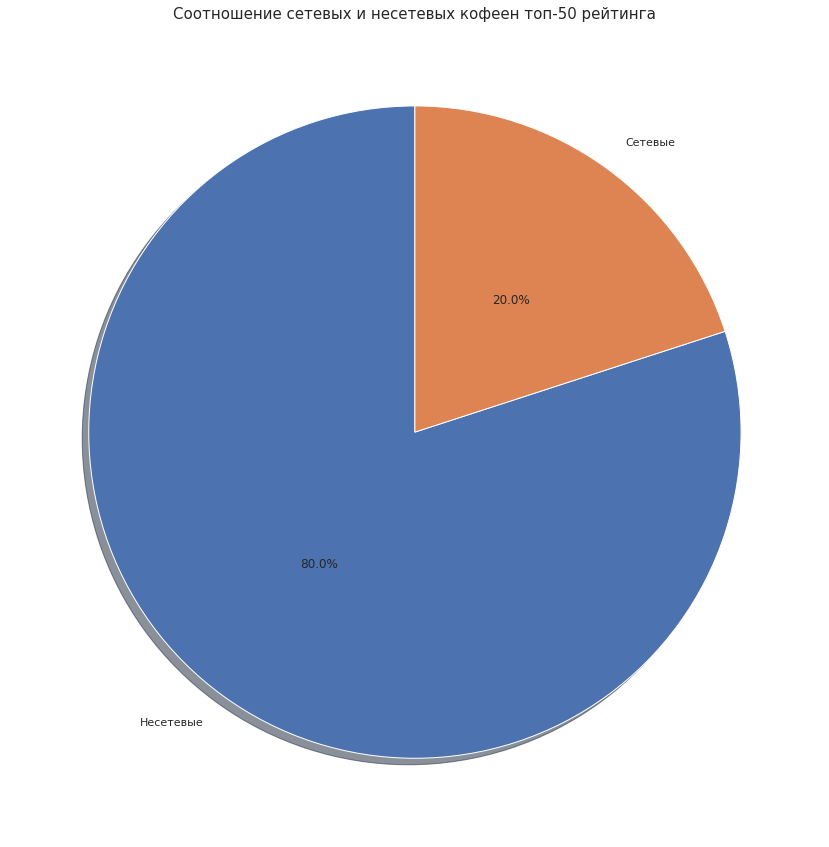

In [106]:
# построим круговой график соотношения сетевых к несетевым кафе из топ-50 рейтинга
coffee_chain = coffee_places1.groupby('chain_place')['name'].count().reset_index().sort_values(by='name', ascending=False)
#labels = chain['chain_place']
labels=['Несетевые', 'Сетевые']
fig, ax = plt.subplots()
ax.pie(coffee_chain['name'], labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, pctdistance=0.5)
plt.title("Соотношение сетевых и несетевых кофеен топ-50 рейтинга", fontsize=15);

Несмотря на то что соотношение сетевых и несетевых кофеен примерно одинаковое, в топ -15 кофеен Москвы входят в основном сетевые. Лидирует Шоколадница, one price coffee и cofix. Всего кофеен в топ-15 377 единиц на 15 кофеен. Также карта расположения  кофеен с лучшим рейтингов 4,9 и выше - выделила в топ-50 по рейингу, показала, что в основном кофейни расположены в Северном А.О. и ЦАО. А также кофейни с лучшим рейтингом - топ-50 как правило не сетевые.

### Рекоммендации по открытию нового заведения


Выбор месторасположения кафе:

- рассматриваемые районы: Западный, Центральный, Юго-Западный, Восточный. Причина: средняя стоимость чашки кофе выше средней по Москве.

Кол-во мест: 

- Западный - около 100, Центральный - 80, Юго- Западный -70, Восточный - 60.
Здесь важно считать экономику в целом и выбирать в зависимости от условий аренды помещения, и подсчитывать экономику каждого квадрата по окупаемости. Лучше пока ориентироваться на 70-80 посадочных мест, как среднее значение по рассматриваемым районам.

Рейтинг кафетерий: 

- Западный -4.1, ЦАО -4,3, Юго-Западный -4.28, Восточный - 4.28.
По рейтингу здесь самый высокий у ЦАО. Преимущественно выбрать Западный, Юго-Западный и  Восточный - проще будет конкурировать по среднему рейтингу. 
А вот если рассматривать топ-50 мест по Москве, то таблица показывает, что самые лучшие заведения и как правило не сетевые расположены в Северном и ЦАО округах.

Круглосуточные кафеини: 

- Западный -9 заведений, ЦАО -27 заведений, Юго-Западный -6 заведений, Восточный - 5 заведений.
Здесь я бы ориентировалась на спрос. Можно поэксперементировать в летнее время и сделать кафе круглосуточным, как будет работать и будет ли окупать себя. 

Исходя из вышепредставленной информации для меня видится интересным открытие кафе на Западе Москвы. Рейтинг кафе там низкий, средняя стоимость чашки кофе выше средней по Москве, можно пробовать открывать круглосуточное кафе, так как есть тенденция на их спрос.

Конечно же при принятии реений необходимо учитывать и ряд других факторов, которые не были показаны в данных - это и чистую выручку, и число открытия новых и закрытия старых кафе, это и пропусная способность и спрос на кофе в районе в целом. 

Презентация: <https://clck.ru/34JpDQ>

**В ходе работы были проделаны следующие шаги:**

- загружены и изучены данные, 
- проверены явные и неявные дубли, 
- изучены пропуски, заполнение которых не преставлялось возможным, 
- произведен анализ всех категорий общественного питания и сделаны выводы по ним, 
- изучены данные по кофейням и предложено место и стартегия развития нового кафе, 
- сделан отчет, представленный в виде презентации.
